# DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) groups points by areas of 
high sample density and marks isolated points as noise. 
It does not require the number of clusters and can discover arbitrarily shaped clusters.

### Key concepts
- $\epsilon$-neighborhood: all points within radius $\epsilon$ of a point.
- `min_samples`: minimum number of points (including the point itself) required to consider a point "core".
- Core, border, noise points:
  - Core: at least `min_samples` points in its $\epsilon$-neighborhood
  - Border: not core, but within $\epsilon$ of a core point
  - Noise: neither core nor border
- Clusters form by connecting core points that are density-reachable; border points attach to nearby core clusters.

### Algorithm (high-level)
1. For each unvisited point, check if it is a core point.
2. If core: start a new cluster and grow it by iteratively adding points in $\epsilon$-neighborhoods (density-reachability).
3. If not core: label as noise (may later become border if reached by a cluster).


### Practical parameters
- $\epsilon$: neighborhood radius.
- `min_samples`: density threshold; typical 2D demos use 4–10, increased in higher dimensions.


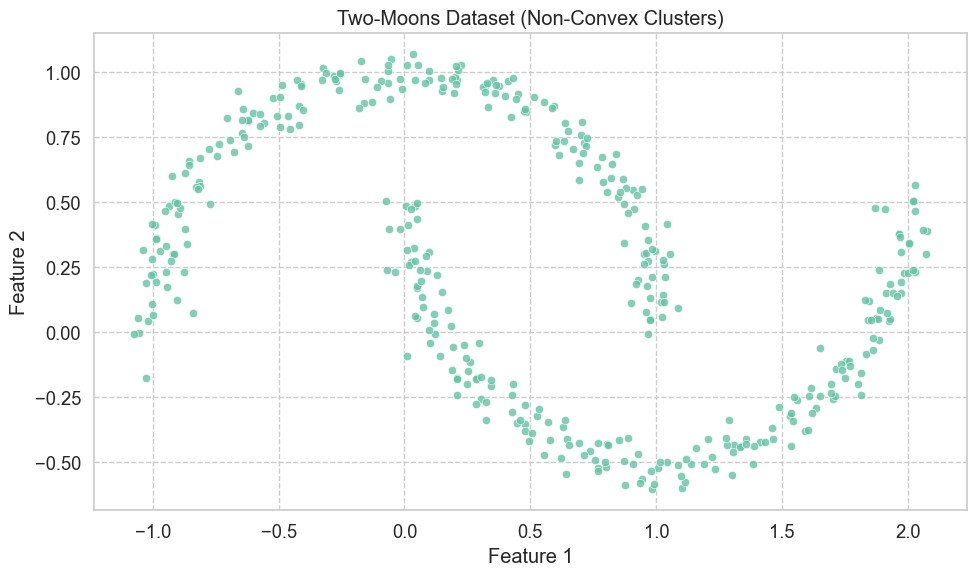

In [1]:

# Imports and style
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_moons
from sklearn.cluster import DBSCAN, KMeans
from sklearn.neighbors import NearestNeighbors

# Plotting style (consistent with other notebooks)
sns.set(font_scale=1.2)
sns.set_style("whitegrid", {"grid.linestyle": "--"})
sns.set_palette("Set2")
plt.rcParams["figure.figsize"] = (10, 6)

# Reproducibility
RNG = 42

# Generate two-moons
X, _ = make_moons(n_samples=400, noise=0.05, random_state=RNG)

# Quick look at the raw data
X_np = np.asarray(X)
plt.figure()
sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], alpha=0.8)
plt.title("Two-Moons Dataset (Non-Convex Clusters)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.tight_layout()
plt.show()



## K-Means vs DBSCAN

- **K-Means**: prefers roughly spherical clusters, requires choosing `k`, sensitive to outliers.
- **DBSCAN**: finds arbitrarily shaped clusters, **flags outliers automatically**, requires `eps` and `min_samples`.


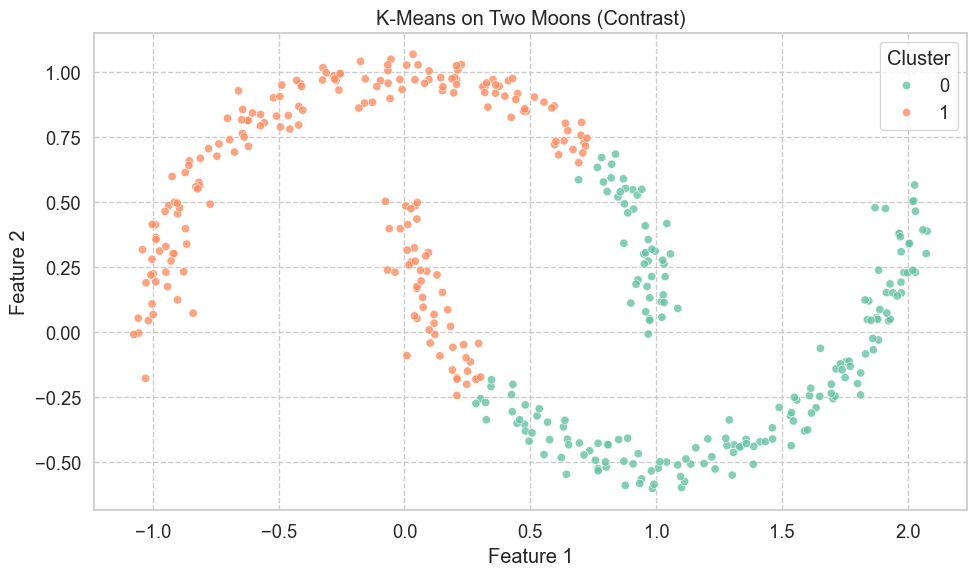

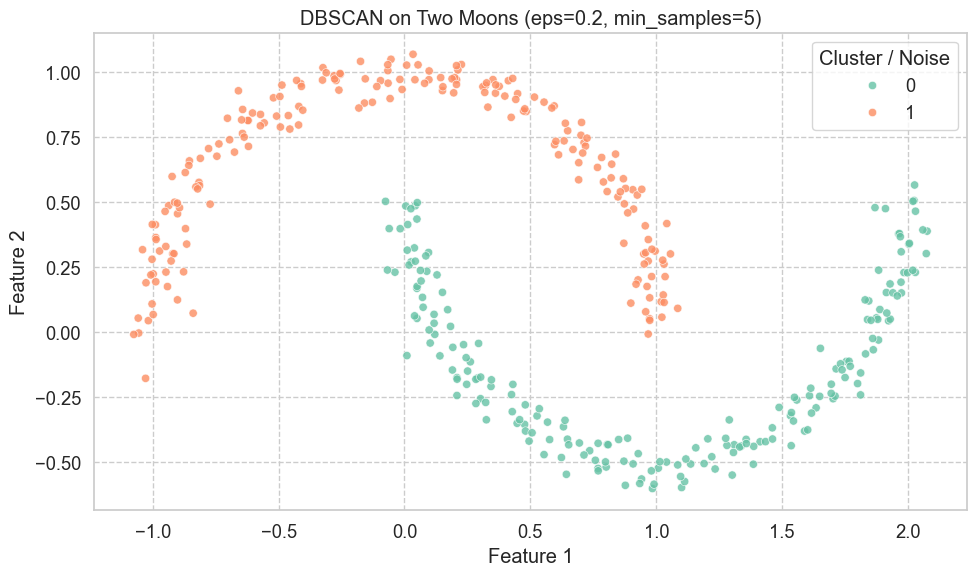

In [2]:
# K-Means for comparison (k=2)
kmeans = KMeans(n_clusters=2, n_init="auto", random_state=RNG)
km_labels = kmeans.fit_predict(X_np)

plt.figure()
sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], hue=km_labels, alpha=0.8)
plt.title("K-Means on Two Moons (Contrast)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(title="Cluster", loc="best")
plt.tight_layout()
plt.show()

# A basic DBSCAN run (parameters chosen after a quick k-distance check below)
db = DBSCAN(eps=0.2, min_samples=5)
db_labels = db.fit_predict(X_np)

plt.figure()
sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], hue=db_labels, alpha=0.8)
plt.title("DBSCAN on Two Moons (eps=0.2, min_samples=5)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(title="Cluster / Noise", loc="best")
plt.tight_layout()
plt.show()


## Hierarchical Clustering on Two Moons

Hierarchical (agglomerative) clustering builds a tree of merges using a linkage criterion (e.g., Ward, complete). With Euclidean distances and standard linkages, it typically struggles with non-convex shapes like the two moons and tends to cut across the crescent.


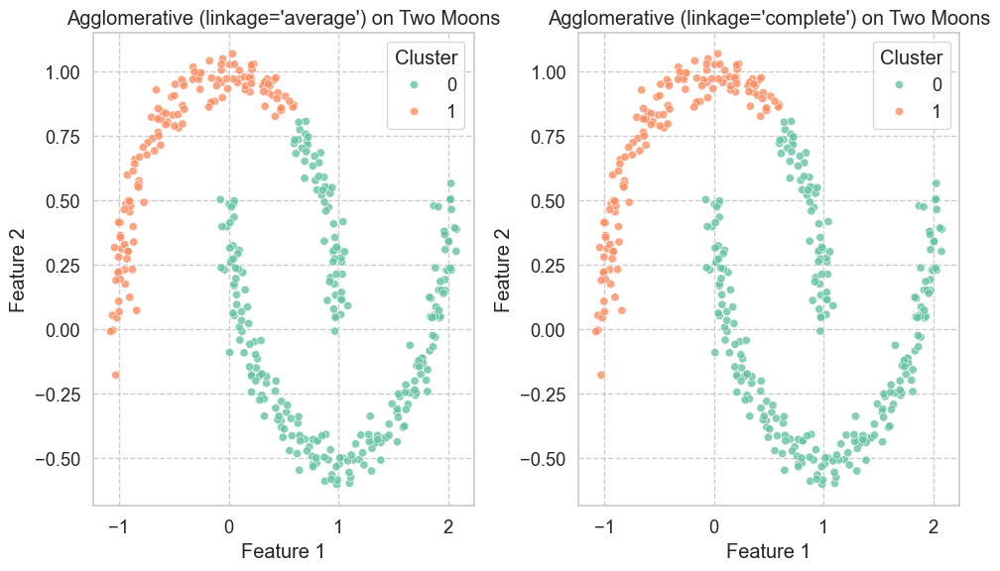

In [3]:
from sklearn.cluster import AgglomerativeClustering

# Try two common linkages on the moons
def plot_agglomerative(linkage: str, ax):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    labels = model.fit_predict(X_np)
    sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], hue=labels, alpha=0.8, ax=ax)
    ax.set_title(f"Agglomerative (linkage='{linkage}') on Two Moons")
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")
    ax.legend(title="Cluster", loc="best")

fig, axes = plt.subplots(1, 2)
plot_agglomerative("average", axes[0])
plot_agglomerative("complete", axes[1])
plt.tight_layout()
plt.show()


## DBSCAN from scratch

Below we will implement DBSCAN, using the half-moon dataset as an example, and 
animate the algorithm's progress.

The algorithm is implemented in the following steps:
1. Compute the ε-neighborhood for each point.
2. Classify every point as core or non-core.
3. Expand clusters from core points via a queue (seed set) and breadth-first search.
4. Record the state of the algorithm after each step.


In [4]:
from collections import deque
from matplotlib import patches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from typing import Tuple, List, Dict, Optional, Any, cast
from matplotlib.axes import Axes
from numpy.typing import NDArray

X, _ = make_moons(n_samples=150, noise=0.05, random_state=RNG)
X = cast(NDArray[np.floating], np.asarray(X, dtype=float))

def region_query(X: NDArray[np.floating], idx: int, eps: float) -> NDArray[np.int_]:
    """Returns indices of points within ε of the point at index ``idx`` (including itself).

    Args:
        X: Array of shape (n_samples, n_features) containing point coordinates.
        idx: Integer index of the query point in ``X``.
        eps: Neighborhood radius ε.

    Returns:
        A 1D NumPy array of integer indices for all points within the ε-neighborhood
        of ``X[idx]`` (including ``idx``).
    """
    # Vector difference from every point to the query point
    diffs = X - X[idx]
    # Squared Euclidean distance (avoids sqrt; monotonic with actual distance)
    d2 = (diffs * diffs).sum(axis=1)
    # Points whose distance is within the ε-ball
    return np.where(d2 <= eps * eps)[0]

def classify_points(X: NDArray[np.floating], eps: float, min_samples: int) -> Tuple[NDArray[np.bool_], List[NDArray[np.int_]]]:
    """Classifies points as core/non-core and caches ε-neighborhoods for all points.

    Args:
        X: Array of shape (n_samples, n_features) containing point coordinates.
        eps: Neighborhood radius ε.
        min_samples: Minimum number of points (including the point itself) required
            for a point to be considered a core point.

    Returns:
        core_mask: Boolean array of shape (n_samples,) where True marks core points.
        neighborhoods: List of 1D NumPy arrays; ``neighborhoods[i]`` contains indices
            of all points within ε of point ``i`` (including ``i``).
    """
    n = len(X)
    core_mask = np.zeros(n, dtype=bool)
    neighborhoods = []

    for i in range(n):
        # Compute ε-neighborhood for point i
        neigh = region_query(X, i, eps)
        neighborhoods.append(neigh)
        # Core criterion: at least ``min_samples`` points in ε-neighborhood (includes itself)
        if len(neigh) >= min_samples:
            core_mask[i] = True

    return core_mask, neighborhoods

def dbscan_with_states(
    X: NDArray[np.floating],
    eps: float = 0.2,
    min_samples: int = 5
) -> Tuple[
    NDArray[np.int_],
    List[Dict[str, Any]],
    NDArray[np.bool_]
]:
    """The main DBSCAN algorithm.

    Here we also record the state of the algorithm after each step,
    for illustration purposes.

    Label semantics:
        -99: unvisited point
         -1: noise (may later be relabeled as border/cluster)
          0..C-1: cluster ids assigned to points

    Args:
        X: Array of shape (n_samples, n_features) containing point coordinates.
        eps: Neighborhood radius ε.
        min_samples: Minimum number of points to declare a point as core.

    Returns:
        labels: 1D array of ints with the final label per point.
        frames: List of snapshots (dicts) used by the animator; each frame contains:
            - "labels": current labels array
            - "core_mask": Boolean core/non-core array
            - "current_idx": index of the point currently processed (or None)
            - "show_circle": whether to draw the ε-circle for the current point
        core_mask: Boolean array indicating which points are core points.
    """
    n = len(X)
    # Initialize labels as unvisited
    labels = np.full(n, -99, dtype=int)
    # Precompute neighborhoods and core status for all points
    core_mask, neighborhoods = classify_points(X, eps, min_samples)
    frames = []

    # Helper to record a snapshot of the current state for animation
    def snapshot(current_idx=None, show_circle=True):
        frames.append({
            "labels": labels.copy(),
            "core_mask": core_mask.copy(),
            "current_idx": current_idx,
            "show_circle": show_circle,
        })

    # Initial snapshot: everything unvisited
    snapshot(None, False)
    current_cluster = -1

    # Iterate over points; expand clusters from core points via a queue (seed set)
    for i in range(n):
        if labels[i] != -99:
            # Already visited (noise or assigned)
            continue

        neigh = neighborhoods[i]
        if len(neigh) < min_samples:
            # Not a core point → mark as noise candidate (might be relabeled later)
            labels[i] = -1
            snapshot(i, True)
            continue

        # Start a new cluster from this core point
        current_cluster += 1
        labels[i] = current_cluster
        # Seed queue contains its ε-neighbors (except itself)
        seeds = deque([j for j in neigh if j != i])
        snapshot(i, True)

        # Breadth-first expansion: density-connected growth
        # After this queue is empty, the cluster is fully expanded
        while seeds:
            j = seeds.popleft()
            if labels[j] == -99:
                # First time visiting j → assign to current cluster
                labels[j] = current_cluster
                snapshot(j, True)
                neigh_j = neighborhoods[j]
                if len(neigh_j) >= min_samples:
                    # j is a core point → add its neighbors for further expansion
                    for q in neigh_j:
                        if labels[q] in (-99, -1):
                            seeds.append(q)
            elif labels[j] == -1:
                # Previously marked noise becomes part of the cluster (border point)
                labels[j] = current_cluster
                snapshot(j, True)

    # Final snapshot after processing all points
    snapshot(None, False)
    return labels, frames, core_mask

def plot_frame(ax: Axes, frame: Dict[str, Any], X: np.ndarray, eps: float) -> None:
    """Draws a single animation frame showing DBSCAN's evolving state.

    Args:
        ax: Matplotlib Axes to draw on.
        frame: Snapshot dict with keys: "labels", "core_mask", "current_idx", "show_circle".
        X: Data array of shape (n_samples, n_features).
        eps: ε used for the neighborhood (sets the radius of the drawn circle).
    """
    ax.clear()
    ax.set_title("DBSCAN expansion")
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")

    # Fix axis limits and enforce 1:1 aspect ratio for consistent visuals
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    range_x = x_max - x_min
    range_y = y_max - y_min
    range_max = max(range_x, range_y)
    x_center = (x_max + x_min) / 2.0
    y_center = (y_max + y_min) / 2.0
    pad = 0.05 * range_max
    ax.set_xlim(x_center - range_max / 2.0 - pad, x_center + range_max / 2.0 + pad)
    ax.set_ylim(y_center - range_max / 2.0 - pad, y_center + range_max / 2.0 + pad)
    ax.set_aspect("equal", adjustable="box")

    L = frame["labels"]
    core = frame["core_mask"]
    current_idx = frame["current_idx"]
    show_circle = frame["show_circle"]

    # Points not yet visited by the algorithm
    unvisited = (L == -99)
    # Points currently considered noise
    noise = (L == -1)

    # Unvisited points (small, dim markers)
    if np.any(unvisited):
        ax.scatter(X[unvisited,0], X[unvisited,1], s=24, marker=".",
                   label="unvisited")

    # Noise points (cross markers)
    if np.any(noise):
        ax.scatter(X[noise,0], X[noise,1], s=36, marker="x",
                   label="noise")

    # Clusters formed so far (vary marker shapes per cluster id)
    cluster_ids = sorted([c for c in np.unique(L) if c >= 0])
    cluster_markers = ["o","^","s","P","D","v","X","*",">","<"]
    for idx, cid in enumerate(cluster_ids):
        mk = cluster_markers[idx % len(cluster_markers)]
        pts = (L == cid)
        ax.scatter(X[pts,0], X[pts,1], s=36, marker=mk, label=f"cluster {cid}")

    # Highlight the current point and draw its ε-neighborhood circle
    if (current_idx is not None) and show_circle:
        cx, cy = X[current_idx]
        circ = patches.Circle((cx, cy), radius=eps, fill=True, linestyle="--", alpha=0.2)
        ax.add_patch(circ)
        ax.scatter([cx],[cy], s=64, marker="o", linewidths=1, label="current")

    ax.legend(loc="best")


def _update(i):
    plot_frame(ax, frames[i], cast(np.ndarray, X), eps)
    return []

# Run once to capture frames
eps = 0.3
min_samples = 5
labels_teach, frames, core_mask = dbscan_with_states(X, eps=eps, min_samples=min_samples)

# Build animation
fig, ax = plt.subplots(figsize=(9,9))

anim = FuncAnimation(fig, _update, frames=len(frames), interval=250, blit=False)
html = HTML(anim.to_jshtml())
plt.close(fig)  # prevent auto-displaying the static figure
html


### Choosing $\epsilon$ in DBSCAN 

In DBSCAN, we use $\epsilon$ to define the region of neighborhood to a point.
A point is a core point if it has at least `min_samples` neighbors within $\epsilon$.
With a fixed `min_samples`:

- Larger $\epsilon$ = fewer noise points and more cluster merging
- Smaller $\epsilon$ = more noise and more fragmented clusters

**Interplay with min_samples**:
  - Increasing `min_samples` generally requires increasing $\epsilon$ to keep enough neighbors.
  - Common starting points: `min_samples ≈ d + 1` to `2d` (d = features), or 10–20 for moderate datasets. Then tune $\epsilon$ accordingly.

**k-distance elbow heuristic**:
  - Compute each point’s distance to its k-th nearest neighbor (k = `min_samples`) and sort ascending.
  - The “elbow” marks the transition from dense cores to sparser regions. Pick $\epsilon$ slightly above that knee.
  - In high dimensions the elbow can be subtle; consider dimensionality reduction (e.g., PCA) before using the plot.

**Scale and metric**:
  - Always standardize features; otherwise one dimension dominates distances.
  - Choose a metric consistent with your data geometry (euclidean vs cosine, etc.). The same $\epsilon$ value has different meanings under different metrics.

**Practical selection workflow**:
  1) Scale features; set an initial `min_samples`.
  2) Use the k-distance plot to get a first $\epsilon$ guess (slightly above the knee).
  3) Inspect results: proportion of noise, cluster count, and cluster shapes vs domain expectations.
  4) Adjust: increase $\epsilon$ if too many noise points; decrease if clusters are merging or shapes look bloated.
  5) If elbow is unclear: try PCA to a reasonable dimensionality, try different metrics, or use a percentile rule (e.g., median or 90th percentile of k-distances) as a starting point, then refine by validation.

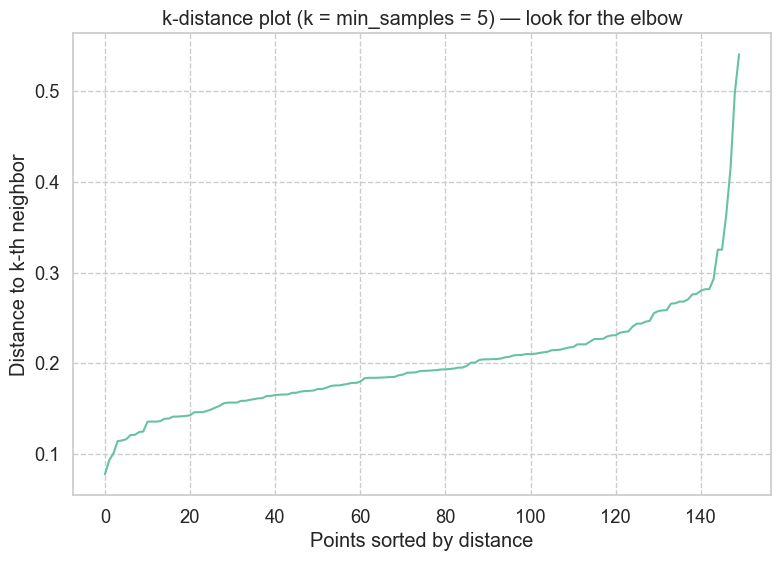

Tip: Choose eps as the y-axis value slightly above the 'elbow' where the curve starts to bend up.


In [5]:
from sklearn.preprocessing import StandardScaler

min_samples = 5  # common default

# Fit NearestNeighbors to compute k-distances
X_scaled = StandardScaler().fit_transform(X)
nn = NearestNeighbors(n_neighbors=min_samples)
nn.fit(X_scaled)
dists, _ = nn.kneighbors(X_scaled)

# For each point, take the distance to the k-th neighbor (index -1 after sorting along axis=1)
# Here k = min_samples
k_dists = np.sort(dists[:, -1])
plt.figure(figsize=(9, 6))
plt.plot(k_dists)
plt.title(f"k-distance plot (k = min_samples = {min_samples}) — look for the elbow")
plt.xlabel("Points sorted by distance")
plt.ylabel("Distance to k-th neighbor")
plt.show()

# A small printed hint for live teaching
print("Tip: Choose eps as the y-axis value slightly above the 'elbow' where the curve starts to bend up.")